In [89]:
import numpy as np
import scipy.stats 
from CIR import get_CIR
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import numpy as np
from simulation import Simulation, Contract
from torch.utils.data import TensorDataset, Dataset, DataLoader, Subset

from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [39]:
dataset = torch.load('subgraphs_Duffie_3nodes_3gamma.pt', map_location=torch.device('cpu'))

In [41]:
dataset[0].node_feat

tensor([ 1., -1., -1.])

In [44]:
batch = torch.load('batch.pt')

In [59]:
batch.x

tensor([[ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.],
        [ 1.],
        [-1.],
        [-1.]])

In [70]:
batch.edge_index[:,:5]

tensor([[0, 1, 1, 2, 3],
        [1, 0, 2, 1, 4]])

In [79]:
mask=(batch.batch == 3)

In [80]:
batch.x[mask]

tensor([[ 1.],
        [-1.],
        [-1.]])

In [81]:
edge_mask = mask[batch.edge_index[0]] & mask[batch.edge_index[1]]

In [86]:
batch.edge_index[:, edge_mask]-torch.min(batch.edge_index[:,edge_mask])

tensor([[0, 1, 1, 2],
        [1, 0, 2, 1]])

In [56]:
unique_in = torch.unique(batch.batch)
unique_in

tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [57]:
batch.batch


tensor([0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7,
        8, 8, 8, 9, 9, 9])

In [53]:
from torch_scatter.utils import broadcast

In [54]:
broadcast(batch.batch, batch.x, dim=0)

tensor([[0],
        [0],
        [0],
        [1],
        [1],
        [1],
        [2],
        [2],
        [2],
        [3],
        [3],
        [3],
        [4],
        [4],
        [4],
        [5],
        [5],
        [5],
        [6],
        [6],
        [6],
        [7],
        [7],
        [7],
        [8],
        [8],
        [8],
        [9],
        [9],
        [9]])

In [26]:
a = torch_geometric.loader.DataLoader(train_dataset, batch_size=2)

In [31]:
for edge, node in a:
    print(edge.shape)
    print(edge[0,-1])
    print(edge[1,-1])


torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2

tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
tensor([[0, 1, 0, 0, 0, 0],
        [1, 0, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 0, 0,

tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 1, 1, 2, 0, 0],
        [1, 0, 2, 1, 0, 0]])
tensor([[0, 1, 1, 2,

tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
tensor([[0, 0, 1, 2, 0, 0],
        [1, 2, 0, 0, 0, 0]])
torch.Size([2, 20, 2, 6])
tensor([[0, 0, 1, 2,

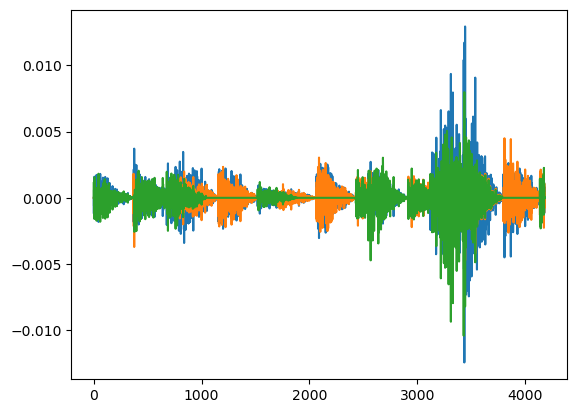

In [36]:
plt.plot(y[0,:])
plt.plot(y[1,:])
plt.plot(y[2,:])

In [168]:
edge_index = torch.tensor([[0,2,3,0,0],[1,0,0,0,0]])

from torch_geometric_temporal.signal import DynamicGraphTemporalSignalBatch

In [181]:
a=torch.zeros((3,1))

In [182]:
a[:,0]=r.expand(3)

In [183]:
a

tensor([[0.3000],
        [0.3000],
        [0.3000]])

In [167]:
dataset

<bound method WikiMathsDatasetLoader.get_dataset of <torch_geometric_temporal.dataset.wikimath.WikiMathsDatasetLoader object at 0x7f915f435350>>

In [161]:
get_laplacian(edge_index, normalization='sym')

(tensor([[0, 2, 3, 0, 1, 2, 3],
         [1, 0, 0, 0, 1, 2, 3]]),
 tensor([-0., -1., -1.,  1.,  1.,  1.,  1.]))

In [145]:
ten = torch.tensor([[0,2,3,0,0],[1,0,0,0,0]])

In [149]:
r = torch.tensor([0.3])

In [156]:
r.expand(3).reshape(-1,1).shape

torch.Size([3, 1])

In [148]:
# Find the index of the last non-zero element in each row
non_zero_indices = (ten != 0).sum(dim=1)

# Find the maximum index of non-zero elements in each row
max_non_zero_index = non_zero_indices.max()

# Slice the tensor up to the index of the last non-zero element
sliced_ten = ten[:, :max_non_zero_index + 1]

print(sliced_ten)

tensor([[0, 2, 3],
        [1, 0, 0]])


In [92]:
# Fix current device

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)

print('Current device:', device)
#device = 'cuda'

Current device: cuda



# Create dataset

In [91]:
# Generate CIR process

alpha = 0.6
b = 0.04
sigma = 0.14
v_0 = 0.04
years = 60
gamma = 3

sim = Simulation(alpha, b, sigma, v_0, years, gamma = gamma, seed=True)
CIRProcess = torch.tensor(sim.CIRProcess.reshape(-1,1)).to(torch.float32).to(device)

NameError: name 'device' is not defined

In [93]:
steps_ahead = 21

In [4]:
### Create contracts

# Create a new contract every 380 days

#Generate arrival times for the contracts
arrival_times = sim.GetArrivalTimes()#np.array([i*spawn_contract_frequency for i in range(years*100) if i*spawn_contract_frequency < 365*years])#sim.GetArrivalTimes()#
print('Simulation horizon: ', sim.TotPoints)
print('Arrival times: ', arrival_times)

#Build the contracts using Simulation and arrival times
contracts = []
for arrival_time in arrival_times:
    contract = Contract(arrival_time, sim)
    contracts.append(contract)

# Compute maximum number of simultaneously active contracts
max_n_active_contracts = 0
days_with_active_contracts = 0
for t in range(sim.TotPoints):
    n_active_contracts = np.sum([contract.is_active(t) for contract in contracts])
    if n_active_contracts > max_n_active_contracts:
        max_n_active_contracts = n_active_contracts
    if n_active_contracts > 0:
        days_with_active_contracts +=1
        

print(f"Max number of simultaneously active contracts: {max_n_active_contracts}")
print(f"Days with active contracts: {days_with_active_contracts}")

### Create dataset (X = features, y = targets)

n_contract_features = len(contracts[0].get_contract_features(contracts[0].t_0))

#I will fill this one with the indexis of the active contracts
active_times = []
#Only contain active contracts
X = []
y_margin = []
#floating = []
#fixed = []
conditioning = []
active_times = []
#y_benchmark = []

steps_ahead = 21

y_benchmark = torch.zeros((days_with_active_contracts, steps_ahead))

loop = tqdm(range(sim.TotPoints - 1 - steps_ahead + 1))

h = 0

for i_time, t in enumerate(loop):
    
    active_contracts = [contract for contract in contracts if contract.is_active(t)]
    
    #This will contain the contracts
    temp_contract_row = torch.zeros((max_n_active_contracts*n_contract_features))
    temp_y_margin = 0
    
    for i_contract, contract in enumerate(active_contracts):
        
        contract_features = contract.get_contract_features(t)        
        temp_contract_row[i_contract*len(contract_features) : (i_contract+1)*len(contract_features)] = contract_features
        
        temp_y_margin += contract.GetVariationMargin(t)
        
    #Append the computed quantities if contract array is different from just zeros
    if not torch.all(torch.eq(temp_contract_row, torch.zeros_like(temp_contract_row))):
        
        active_times.append(i_time)
        
        X.append(temp_contract_row)
        y_margin.append(temp_y_margin)
        
        for eta in range(steps_ahead):
            
            y_benchmark[h, eta] = sim.ProvideBenchmark(t_l=t, steps_ahead=eta+1, contracts=contracts, n_simulations=100)
        
        h+=1
            
        #y_benchmark.append(sim.ProvideBenchmark(t_l=t, steps_ahead=steps_ahead, contracts=contracts, n_simulations=100))
        #fixed.append(ProvideBenchmarkFixed(t_l=i_time, steps_ahead=steps_ahead, contracts=contracts, sim=sim, n_simulations=100))
        #floating.append(ProvideBenchmarkFloating(t_l=i_time, steps_ahead=steps_ahead, contracts=contracts,sim=sim, n_simulations=100))
        conditioning.append(CIRProcess[i_time])

X = torch.vstack(X)
y_margin = torch.tensor(y_margin)
#y_benchmark = torch.tensor(y_benchmark)
conditioning = torch.tensor(conditioning)

Simulation horizon:  21900
Arrival times:  [  203  1674  1996  2265  3953  4455  4842  5798  6801  6913  7253  7364
  7469  8016  8101  8157  9077  9267  9603  9644 11021 11717 11756 11823
 12039 13284 14114 15095 15420 15538 15758 15869 15878 16217 16977 17886
 18159 18243 20162 20467]
Max number of simultaneously active contracts: 4
Days with active contracts: 10295


  0%|          | 0/21879 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



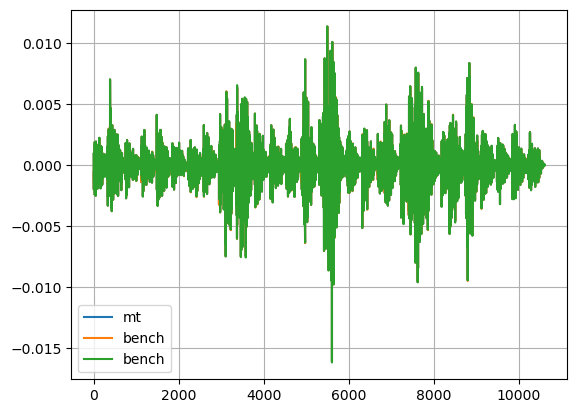

In [7]:
plt.plot(y_margin[1:].cpu(), label='mt')
plt.plot(y_benchmark.cpu(), label='bench')
#plt.xlim(360,370)
plt.grid()
plt.legend()
plt.show()

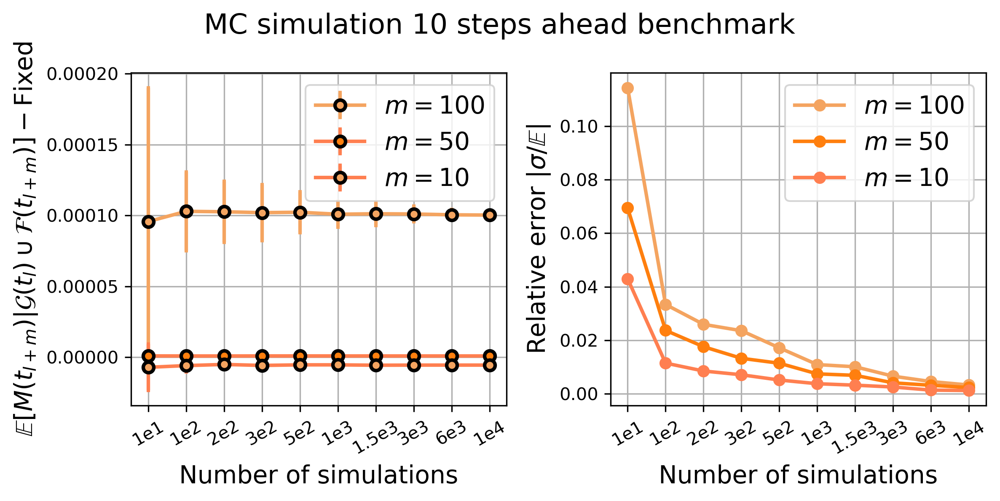

In [100]:
plt.figure(figsize=(8,4), dpi=300)
plt.subplot(1,2,1)
plt.suptitle('MC simulation 10 steps ahead benchmark', fontsize=16)
plt.errorbar(x= np.arange(len(means_100)), y=means_100 -  ProvideFixedPart(1700, 100, contracts, sim), yerr=stds_100, fmt='o-', elinewidth=2, capsize=1, mec='k', mew='2', mfc='sandybrown', color='sandybrown', lw=2, label='$m=100$')
plt.errorbar(x= np.arange(len(means_50)), y=means_50 - ProvideFixedPart(1700, 50, contracts, sim), yerr=stds_50, fmt='o-', elinewidth=2, capsize=1, mec='k', mew='2', mfc='tab:orange', color='coral', lw=2, label='$m=50$')
plt.errorbar(x= np.arange(len(means_10)), y=means_10 -  ProvideFixedPart(1700, 10, contracts, sim), yerr=stds_10, fmt='o-', elinewidth=2, capsize=1, mec='k', mew='2', mfc='sandybrown', color='coral', lw=2, label='$m=10$')
plt.legend(fontsize=14)
plt.xticks([0, 1, 2, 3,4,5,6,7,8,9], ['1e1', '1e2', '2e2', '3e2', '5e2', '1e3', '1.5e3', '3e3', '6e3', '1e4'], rotation=30)
plt.xlabel('Number of simulations', fontsize=14)
plt.ylabel('$\mathbb{E}[M(t_{l+m}) | \mathcal{G}(t_{l}) \cup \mathcal{F}(t_{l+m})] -$Fixed', fontsize=14)
plt.grid()
plt.tight_layout()

plt.subplot(1,2,2)
plt.plot(abs(np.asarray(stds_100)/np.asarray(means_100)), 'o-', color='sandybrown', lw=2, label='$m=100$')
plt.plot(abs(np.asarray(stds_50)/np.asarray(means_50)), 'o-', color='tab:orange', lw=2, label='$m=50$')
plt.plot(abs(np.asarray(stds_10)/np.asarray(means_10)), 'o-', color='coral', lw=2, label='$m=10$')
plt.legend(fontsize=14)
plt.xticks([0, 1, 2, 3,4,5,6,7,8,9], ['1e1', '1e2', '2e2', '3e2', '5e2', '1e3', '1.5e3', '3e3', '6e3', '1e4'], rotation=30)
plt.xlabel('Number of simulations', fontsize=14)
plt.ylabel('Relative error $|\sigma / \mathbb{E}|$', fontsize=14)
plt.grid()
plt.tight_layout()

#plt.savefig('MC_benchmark.pdf')
plt.show()

NameError: name 'arrival_times' is not defined

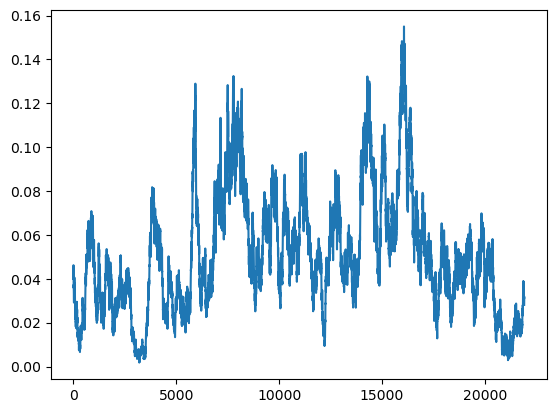

In [8]:
plt.plot(CIRProcess.cpu(), label='CIR')
for i in range(len(arrival_times)):
    plt.axvline(arrival_times[i], ls='--', c='red')
plt.legend()
plt.show()

In [90]:
#Instead of sampling every time, let's save the tensors [HERE 2 STEPS AHEAD]
#torch.save(X, './X_tensor_21_steps.pt')
#torch.save(y_margin, './y_margin_21_steps.pt')
#torch.save(conditioning, './conditioning_21_steps.pt')
#torch.save(y_benchmark, './y_benchmark_21_steps.pt)')

X = torch.load('./X_tensor_2_steps.pt').to(device)
y_margin = torch.load('./y_margin_2_steps.pt').to(device)
conditioning = torch.load('./conditioning_2_steps.pt').to(device)
y_benchmark = torch.load('./y_benchmark_2_steps.pt)').to(device)

NameError: name 'device' is not defined

In [6]:
device

'cuda:1'

In [7]:
# Train-test split

training_index = int(0.8 * X.shape[0])

#Prepare both legs
y_margin_train = y_margin[:training_index]
y_benchmark_train = y_benchmark[:training_index]
X_train = X[:training_index, :]
CIR_train = conditioning[:training_index]

y_margin_test = y_margin[training_index:]
y_benchmark_test = y_benchmark[training_index:]
X_test = X[training_index:, :]
CIR_test = conditioning[training_index:]

In [8]:
def create_windows(features, targets_margin, targets_benchmark, r, lookback, m_steps_ahead = 1):
    """
    Windows the dataset
    """
    n_samples = features.shape[0] - lookback - m_steps_ahead + 1

    X_data = torch.zeros(n_samples, lookback, features.shape[1])
    y_margin_data = torch.zeros(n_samples, m_steps_ahead)
    y_benchmark_data = torch.zeros(n_samples, m_steps_ahead)
    
    #For the multi-steps ahead prediction i need to change it
    r_data = torch.zeros(n_samples, m_steps_ahead)
    
    loop = tqdm(range(n_samples), desc='n_samples')

    for i_sample in loop:

        X_data[i_sample, :] = features[i_sample : i_sample + lookback]   #it takes data in [i_sample, i_sample+lookback)
        
        y_margin_data[i_sample] = targets_margin[i_sample + lookback : i_sample + lookback + m_steps_ahead]
        y_benchmark_data[i_sample] = targets_benchmark[i_sample + lookback]
        
        r_data[i_sample] = r[i_sample + lookback : i_sample + lookback + m_steps_ahead] - r[i_sample + lookback -1 : i_sample + lookback + m_steps_ahead -1]

        
    return X_data.to(torch.float32).to(device), y_margin_data.to(torch.float32).to(device), r_data.to(torch.float32).to(device), y_benchmark_data.to(torch.float32).to(device)
    

In [9]:
# Slice dataset into windows

lookback = 20
m_steps_ahead = 21
X_train, y_margin_train, r_train, y_benchmark_train = create_windows(X_train, y_margin_train, y_benchmark_train, CIR_train, lookback=lookback, m_steps_ahead=m_steps_ahead)
X_test, y_margin_test, r_test, y_benchmark_test = create_windows(X_test, y_margin_test, y_benchmark_test, CIR_test, lookback=lookback, m_steps_ahead=m_steps_ahead)


n_samples:   0%|          | 0/8196 [00:00<?, ?it/s]

n_samples:   0%|          | 0/2019 [00:00<?, ?it/s]

In [47]:
plt.plot(y_benchmark_train.cpu(), label='bench')
plt.plot(y_margin_train.cpu(), label='M(t+1)')
#plt.plot(fixed_train.cpu(), label='E_fixed(t+1)')
#plt.plot(floating_train.cpu(), label='E_floating(t+1)')
#plt.xlim(700,725)
#plt.axvline(1878, ls='--', c='red')
plt.grid()
plt.legend()
plt.show()

KeyboardInterrupt: 

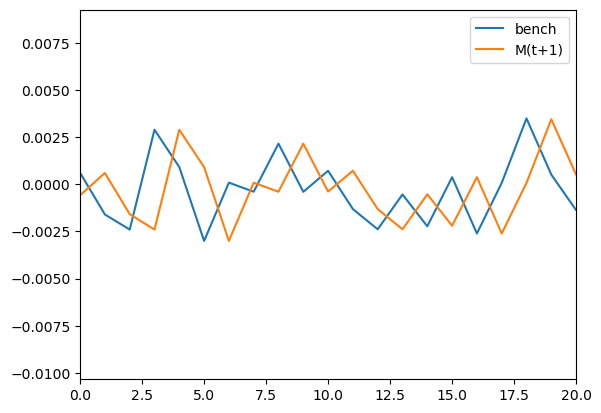

In [53]:
plt.plot(y_benchmark_test.cpu(), label='bench')
plt.plot(y_margin_test.cpu(), label='M(t+1)')

#plt.plot(y_float_test.cpu(), label='V_float(t+1)')
plt.xlim(0, 20)#500)
plt.legend()
plt.show()

In [10]:
#Build the pytorch datasets and dataloaders
train_dataset = TensorDataset(X_train.to(device), y_margin_train.to(device), r_train.to(device), y_benchmark_train.to(device))
test_dataset = TensorDataset(X_test.to(device), y_margin_test.to(device), r_test.to(device), y_benchmark_test.to(device))

torch.manual_seed(0)
loader = DataLoader(train_dataset, shuffle=True, batch_size=1000)
loader_test = DataLoader(test_dataset, shuffle=True, batch_size = 1000)

In [11]:
#define the model
class LSTMPermuter(nn.Module):

    def __init__(self):
        super(LSTMPermuter, self).__init__()

    def forward(self, x):
        tensor = x.permute(0, 2, 1)
        return tensor
        
class model(nn.Module):

    def __init__(self):
        super(model, self).__init__()

        input_size = 5
        self.input_size = input_size
        lstm_hidden_size = 15 
        lstm_n_layers = 1
        regressor_hidden_size = 512 
        self.name=regressor_hidden_size

        self.lstm = torch.nn.LSTM(input_size=input_size, 
                             hidden_size=lstm_hidden_size, 
                             num_layers=lstm_n_layers)
        
        self.batchnormer = torch.nn.Sequential(LSTMPermuter(),
                                               nn.BatchNorm1d(lstm_hidden_size),
                                               LSTMPermuter())
        
        #Il +1 è perchè facciamo il concat con il reference interest rate
        self.regressor = nn.Sequential(nn.Linear(lstm_hidden_size+1, regressor_hidden_size),
                                       #nn.BatchNorm1d(regressor_hidden_size),
                                       nn.ReLU(),
                                       nn.Linear(regressor_hidden_size, regressor_hidden_size),
                                       #nn.BatchNorm1d(regressor_hidden_size),
                                       nn.ReLU(),
                                       nn.Linear(regressor_hidden_size, input_size))
        
        self.fc = nn.Linear(input_size,1)
        self.relu = nn.ReLU()
        
        
        self.reset_parameters()

    def forward(self, x, r, steps):
    
        pred = torch.zeros((x.shape[0], steps)).to(torch.float32).to(device)

        for i in range(x.shape[2]//self.input_size):
            
            contract = x[:,:, i*self.input_size : (i+1)*self.input_size] 
            #if the contract is non empty:
            
            if not torch.all(torch.eq(contract, torch.zeros_like(contract))):
                
                for j in range(steps):
                
                    lstm_hidden, _ = self.lstm(contract)
                    #lstm_hidden = self.batchnormer(lstm_hidden)
                    prediction = self.regressor(torch.squeeze(torch.cat([lstm_hidden[:,-1,:], r[:,j].reshape(-1,1)],dim=1)))
                    
                    #print('j: ',j, ' i: ',i)
                    
                    pred[:, j] += self.fc(self.relu(prediction)).squeeze()
                    #prediction = prediction.unsqueeze(0).unsqueeze(0) #CHANGE TRAINING / PREDICTION
                    prediction = prediction.unsqueeze(1)
                    contract = torch.cat([contract[:, 1:, :], prediction], dim = 1)
            else:
                break
         
        return pred
    
    
    def reset_parameters(self):

        self.lstm.reset_parameters()
        self.fc.reset_parameters()
        for layer in [self.regressor]:
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()
                
    def do_epoch(self, loader, criterion, optimizer, steps_ahead=1, training=True):
        """
        Trains the model over the batches for an epoch
        """

        #Instantiate a temp variable that tracks the average loss for the batches
        temp_loss = 0

        #Loop over data batches
        for X_batch, y_margin_batch, r_batch, y_benchmark in loader:
            
            #.forward() method of the model, will output both V_float and V_fixed
            y_pred = self(X_batch, r_batch, steps=steps_ahead)
            y_margin_pred = y_pred
            
            loss = torch.stack([criterion(y_margin_pred[:,i], y_margin_batch[:,i]) for i in range(steps_ahead)]).mean()

            #Compute the loss - FOCUS ON FIXED LEG
            #loss = criterion(y_margin_pred.squeeze(), y_margin_batch.squeeze())

            #If we are actually training the model instead of performing validation
            if training:

                #Backpropagation
                loss.backward()

                #Optimizer step
                optimizer.step() 
                optimizer.zero_grad()

            #Track the batch loss
            temp_loss += loss.item()

        #Take the average loss over the batches
        return temp_loss / len(loader)

In [12]:
#Let's get towards the training:

lr = 5e-3                        #Learning rate
criterion = nn.MSELoss()           #Loss function

#Define the model
mymodel = model().to(device)    

#optimizer & scheduler
optimizer = torch.optim.Adam(mymodel.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[130*i for i in range(60)], gamma=0.9)

steps_ahead = 21
n_epochs = 20000                   #Number of epochs

#Early stopping parameters
patience = 50                      #Number of consecutive epochs to wait for improvement

In [13]:
#Early stopping class
class EarlyStopping:
    
    def __init__(self, patience):
        self.patience = patience
        self.counter = 0
        self.best_score = 10
        self.early_stop = False

    def __call__(self, val_loss, model):
    
        if val_loss > self.best_score:

            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:

            self.best_score = val_loss
            self.save_checkpoint(model)
            self.counter = 0

    def save_checkpoint(self, model):
        torch.save(model.state_dict(), f'temp_state_dict{mymodel.name}.pt')

In [14]:
#Define two lists to store training record
training_loss = []
validation_loss = []
lrs = []

#Define a tqdm loop to get a nice progress bar
loop = tqdm(range(n_epochs))

#Define an early stopping object
early_stopping = EarlyStopping(patience)

for epoch in loop:

    #Set model in training mode
    mymodel.train()

    #Perform an epoch of training
    train_loss = mymodel.do_epoch(loader, criterion, optimizer, steps_ahead)

    #Scheduler step
    scheduler.step()

    #Track the average over the batches
    training_loss.append(train_loss)

    
    #Validation every 50 epochs
    if epoch % 50 ==0:

        with torch.no_grad():
            #Set the model in eval mod
            mymodel.eval()

            test_loss = mymodel.do_epoch(loader_test, criterion, optimizer, steps_ahead, training=False)

            #Track the average loss over the batches
            validation_loss.append(test_loss)

        #Check early stopping
        early_stopping(validation_loss[-1], mymodel)
        if early_stopping.early_stop:

            #Load the best set of parameters
            mymodel.load_state_dict(torch.load(f'temp_state_dict{mymodel.name}.pt'))
            print(f"Early stopping at epoch {epoch}.")
            break

    lrs.append(optimizer.param_groups[0]["lr"])
            
    #Give informations in the loop
    loop.set_postfix(loss = train_loss, val_loss = test_loss, best_val_loss = early_stopping.best_score, counter=early_stopping.counter, lr= lrs[-1])


  0%|          | 0/20000 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



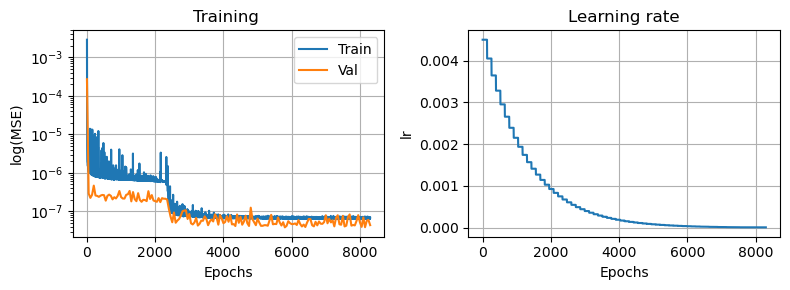

In [23]:
#Plot training record & learning rate schedule

plt.figure(figsize=(8,3))

plt.subplot(1,2,1)
plt.plot(training_loss, label='Train')
val_epochs= np.linspace(0, len(training_loss), num=len(validation_loss))
plt.plot(val_epochs, validation_loss, label='Val')
plt.yscale('log')
plt.legend()
plt.grid()
plt.xlabel('Epochs')
plt.ylabel('log(MSE)')
plt.title('Training ')

plt.subplot(1,2,2)
plt.plot(lrs)
plt.grid()
plt.xlabel('Epochs')
plt.ylabel('lr')
plt.title('Learning rate')

plt.tight_layout()
plt.show()

In [22]:
np.min(validation_loss)

3.854306710830239e-08

In [17]:
class model(nn.Module):

    def __init__(self):
        super(model, self).__init__()

        input_size = 5
        self.input_size = input_size
        lstm_hidden_size = 15 
        lstm_n_layers = 1
        regressor_hidden_size = 512 
        self.name=regressor_hidden_size

        self.lstm = torch.nn.LSTM(input_size=input_size, 
                             hidden_size=lstm_hidden_size, 
                             num_layers=lstm_n_layers)
        
        self.batchnormer = torch.nn.Sequential(LSTMPermuter(),
                                               nn.BatchNorm1d(lstm_hidden_size),
                                               LSTMPermuter())
        
        #Il +1 è perchè facciamo il concat con il reference interest rate
        self.regressor = nn.Sequential(nn.Linear(lstm_hidden_size+1, regressor_hidden_size),
                                       #nn.BatchNorm1d(regressor_hidden_size),
                                       nn.ReLU(),
                                       nn.Linear(regressor_hidden_size, regressor_hidden_size),
                                       #nn.BatchNorm1d(regressor_hidden_size),
                                       nn.ReLU(),
                                       nn.Linear(regressor_hidden_size, input_size))
        
        self.fc = nn.Linear(input_size,1)
        self.relu = nn.ReLU()
        
        
        self.reset_parameters()

    def forward(self, x, r, steps):
    
        pred = torch.zeros((x.shape[0], steps)).to(torch.float32).to(device)

        for i in range(x.shape[2]//self.input_size):
            
            contract = x[:,:, i*self.input_size : (i+1)*self.input_size] 
            #if the contract is non empty:
            
            if not torch.all(torch.eq(contract, torch.zeros_like(contract))):
                
                for j in range(steps):
                
                    lstm_hidden, _ = self.lstm(contract)
                    #lstm_hidden = self.batchnormer(lstm_hidden)
                    prediction = self.regressor(torch.squeeze(torch.cat([lstm_hidden[:,-1,:], r[:,j].reshape(-1,1)],dim=1)))
                    
                    #print('j: ',j, ' i: ',i)
                    
                    pred[:, j] += self.fc(self.relu(prediction)).squeeze()
                    prediction = prediction.unsqueeze(0).unsqueeze(0) #CHANGE TRAINING / PREDICTION
                    #prediction = prediction.unsqueeze(1)
                    contract = torch.cat([contract[:, 1:, :], prediction], dim = 1)
            else:
                break
         
        return pred
    
    
    def reset_parameters(self):

        self.lstm.reset_parameters()
        self.fc.reset_parameters()
        for layer in [self.regressor]:
            if hasattr(layer, 'reset_parameters'):
                layer.reset_parameters()
                
    def do_epoch(self, loader, criterion, optimizer, steps_ahead=1, training=True):
        """
        Trains the model over the batches for an epoch
        """

        #Instantiate a temp variable that tracks the average loss for the batches
        temp_loss = 0

        #Loop over data batches
        for X_batch, y_margin_batch, r_batch, y_benchmark in loader:
            
            #.forward() method of the model, will output both V_float and V_fixed
            y_pred = self(X_batch, r_batch, steps=steps_ahead)
            y_margin_pred = y_pred
            
            loss = torch.stack([criterion(y_margin_pred[:,i], y_margin_batch[:,i]) for i in range(steps_ahead)]).mean()

            #Compute the loss - FOCUS ON FIXED LEG
            #loss = criterion(y_margin_pred.squeeze(), y_margin_batch.squeeze())

            #If we are actually training the model instead of performing validation
            if training:

                #Backpropagation
                loss.backward()

                #Optimizer step
                optimizer.step() 
                optimizer.zero_grad()

            #Track the batch loss
            temp_loss += loss.item()

        #Take the average loss over the batches
        return temp_loss / len(loader)

In [18]:
#Makes the predictions
def predictions(dataset, model, steps):

    dataloader = DataLoader(dataset, shuffle=False, batch_size=1)

    y_margin_preds = torch.ones(len(dataloader), steps)
    y_margin_trues = torch.ones(len(dataloader), steps)
    y_benchmark_true = torch.ones(len(dataloader), steps)
    loop = tqdm(dataloader, desc='Prediction')
    
    for i_sample, (X, y_margin, r, y_benchmark) in enumerate(loop):
        with torch.no_grad():
            
            #print(r.shape)
            
            y_preds =  model(X,r,steps).cpu()
            
            #print(y_preds.shape)
            #print(y_margin.shape)
            

            y_margin_preds[i_sample] = y_preds
            y_margin_trues[i_sample]  = y_margin.cpu()
            y_benchmark_true[i_sample] = y_benchmark.cpu()
            
    return y_margin_trues.numpy(), y_benchmark_true.numpy(), y_margin_preds.numpy()


In [19]:
mymodel = model().to(device)  
mymodel.load_state_dict(torch.load(f'temp_state_dict{mymodel.name}.pt'))

<All keys matched successfully>

In [20]:
#Get the predictions
steps_ahead = 21
train_margin_labels, train_benchmark, train_margin_predictions = predictions(train_dataset, mymodel,steps=steps_ahead)
test_margin_labels, test_benchmark, test_margin_predictions = predictions(test_dataset, mymodel, steps=steps_ahead)


Prediction:   0%|          | 0/8196 [00:00<?, ?it/s]

Prediction:   0%|          | 0/2019 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
steps_ahead = 21
np.save(f'./results/train_label_{steps_ahead}.npy',train_margin_labels)
np.save(f'./results/train_pred_{steps_ahead}.npy',train_margin_predictions)
np.save(f'./results/train_benchmark_{steps_ahead}.npy', train_benchmark)
np.save(f'./results/test_label_{steps_ahead}.npy',test_margin_labels)
np.save(f'./results/test_pred_{steps_ahead}.npy',test_margin_predictions)
np.save(f'./results/test_benchmark_{steps_ahead}.npy', test_benchmark)

In [95]:
train_margin_labels = np.load(f'./results/train_label_{steps_ahead}.npy')
train_margin_predictions = np.load(f'./results/train_pred_{steps_ahead}.npy')
train_benchmark = np.load(f'./results/train_benchmark_{steps_ahead}.npy')
test_margin_labels = np.load(f'./results/test_label_{steps_ahead}.npy')
test_margin_predictions = np.load(f'./results/test_pred_{steps_ahead}.npy')
test_benchmark = np.load(f'./results/test_benchmark_{steps_ahead}.npy')



In [98]:
train_margin_labels.shape
train_margin_predictions.shape
train_benchmark.shape

(8196, 21)

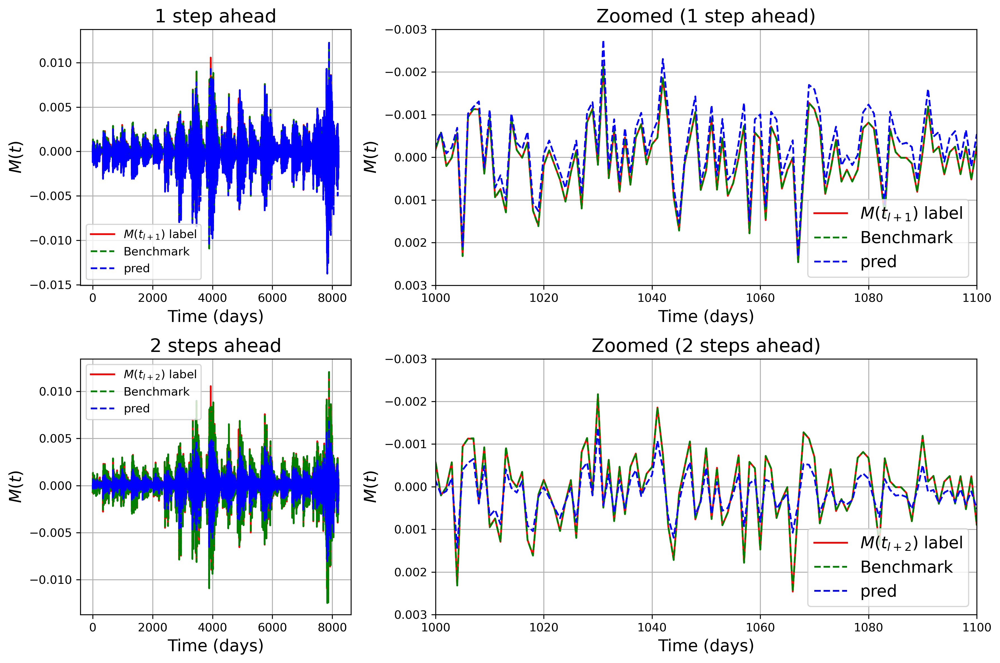

In [177]:
import matplotlib.pyplot as plt

# Plot predictions (train)
fig, axs = plt.subplots(2, 2, figsize=(12, 8), dpi=300, gridspec_kw={'width_ratios': [.4, 0.8]})

# First subplot
axs[0, 0].plot(train_margin_labels[2:, 0], 'r-', label='$M(t_{l+1})$ label')
axs[0, 0].plot(train_benchmark_labels[:, 0], 'g--', label='Benchmark')
axs[0, 0].plot(train_margin_predictions[2:, 0], 'b--', label='pred')
axs[0, 0].grid()
axs[0, 0].legend(fontsize=10)
axs[0, 0].set_xlabel('Time (days)', fontsize=14)
axs[0, 0].set_ylabel('$M(t)$', fontsize=14)
axs[0, 0].set_title('1 step ahead', fontsize=16)

# Second subplot (smaller, on the right)
axs[0, 1].plot(train_margin_labels[2:, 0], 'r-', label='$M(t_{l+1})$ label')
axs[0, 1].plot(train_benchmark_labels[:, 0], 'g--', label='Benchmark')
axs[0, 1].plot(train_margin_predictions[2:, 0], 'b--', label='pred')
axs[0,1].set_xlim(1000,1100)
axs[0,1].set_ylim(0.003,-0.003)
axs[0, 1].grid()
axs[0, 1].legend(fontsize=14)
axs[0, 1].set_xlabel('Time (days)', fontsize=14)
axs[0, 1].set_ylabel('$M(t)$', fontsize=14)
axs[0, 1].set_title('Zoomed (1 step ahead)', fontsize=16)

# Third subplot
axs[1, 0].plot(train_margin_labels[2:, 1], 'r-', label='$M(t_{l+2})$ label')
axs[1, 0].plot(train_benchmark_labels[:, 1], 'g--', label='Benchmark')
axs[1, 0].plot(train_margin_predictions[2:, 1], 'b--', label='pred')
axs[1, 0].grid()
axs[1, 0].legend(fontsize=10)
axs[1, 0].set_xlabel('Time (days)', fontsize=14)
axs[1, 0].set_ylabel('$M(t)$', fontsize=14)
axs[1, 0].set_title('2 steps ahead', fontsize=16)

# Fourth subplot (smaller, on the right)
axs[1, 1].plot(train_margin_labels[2:, 1], 'r-', label='$M(t_{l+2})$ label')
axs[1, 1].plot(train_benchmark_labels[:, 1], 'g--', label='Benchmark')
axs[1, 1].plot(train_margin_predictions[2:, 1], 'b--', label='pred')
axs[1,1].set_xlim(1000,1100)
axs[1,1].set_ylim(0.003,-0.003)
axs[1, 1].grid()
axs[1, 1].legend(fontsize=14)
axs[1, 1].set_xlabel('Time (days)', fontsize=14)
axs[1, 1].set_ylabel('$M(t)$', fontsize=14)
axs[1, 1].set_title('Zoomed (2 steps ahead)', fontsize=16)

plt.tight_layout()
plt.show()


In [125]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

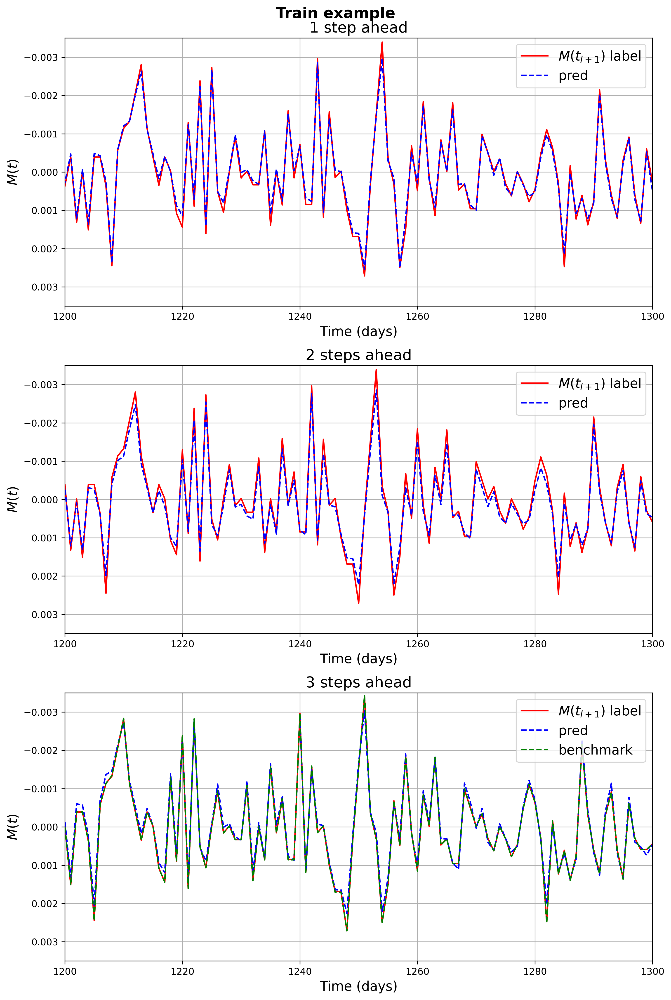

In [48]:
#Plot predictions (train)
plt.figure(figsize=(10,15), dpi=300)

plt.subplot(3,1,1)
plt.plot(train_margin_labels[:,0], 'r-', label='$M(t_{l+1})$ label')
plt.plot(train_margin_predictions[:,0], 'b--', label='pred')
plt.xlim(1200,1300)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('1 step ahead', fontsize=16)

plt.subplot(3,1,2)
plt.plot(train_margin_labels[:,1], 'r-', label='$M(t_{l+1})$ label')
plt.plot(train_margin_predictions[:,1], 'b--', label='pred')
plt.xlim(1200,1300)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('2 steps ahead', fontsize=16)

plt.subplot(3,1,3)
plt.plot(train_margin_labels[1:,2], 'r-', label='$M(t_{l+1})$ label')
plt.plot(train_margin_predictions[1:,2], 'b--', label='pred')
plt.plot(train_benchmark, 'g--', label='benchmark')
plt.xlim(1200,1300)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('3 steps ahead', fontsize=16)
plt.suptitle('Train example', fontsize=16, fontweight='bold')



#plt.savefig('Train_example_fixed_multiple_contracts.pdf')
plt.tight_layout()
plt.show()

In [65]:
train_1_step = criterion(torch.tensor(train_margin_labels[:,0]), torch.tensor(train_margin_predictions[:,0]))
train_2_step = criterion(torch.tensor(train_margin_labels[:,1]), torch.tensor(train_margin_predictions[:,1]))
train_3_step = criterion(torch.tensor(train_margin_labels[:,2]), torch.tensor(train_margin_predictions[:,2]))

test_1_step = criterion(torch.tensor(test_margin_labels[:,0]), torch.tensor(test_margin_predictions[:,0]))
test_2_step = criterion(torch.tensor(test_margin_labels[:,1]), torch.tensor(test_margin_predictions[:,1]))
test_3_step = criterion(torch.tensor(test_margin_labels[:,2]), torch.tensor(test_margin_predictions[:,2]))

test_3_step_bench = criterion(torch.tensor(test_margin_labels[:,2]), torch.tensor(test_benchmark).squeeze())
train_3_step_bench = criterion(torch.tensor(train_margin_labels[:,2]), torch.tensor(train_benchmark).squeeze())

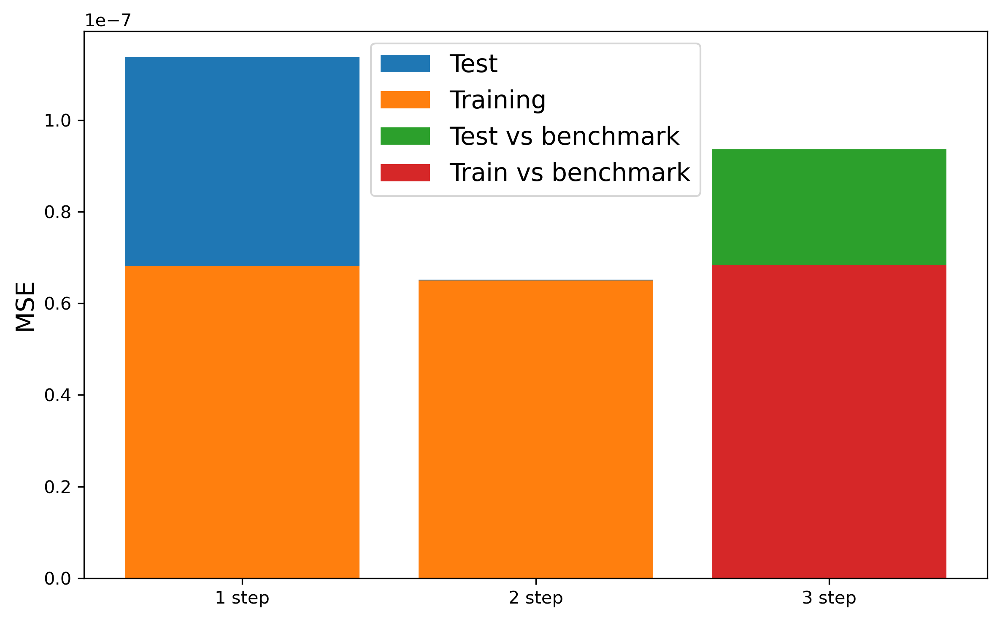

In [67]:
plt.figure(figsize=(8,5), dpi=300)
plt.bar(np.arange(3),[test_1_step, test_2_step, test_3_step], label='Test')
plt.bar(np.arange(3),[train_1_step, train_2_step, train_3_step], label='Training')
plt.bar(2, test_3_step, label = 'Test vs benchmark')
plt.bar(2, train_3_step, label='Train vs benchmark')
plt.xticks(np.arange(3), ['1 step', '2 step', '3 step'])
plt.ylabel('MSE', fontsize=14)
plt.legend(fontsize=14)
#plt.grid()
plt.tight_layout()
plt.show()

In [180]:
np.sum(abs(train_margin_labels[2:,0] - train_benchmark_labels[:-2,0]))

0.085583985

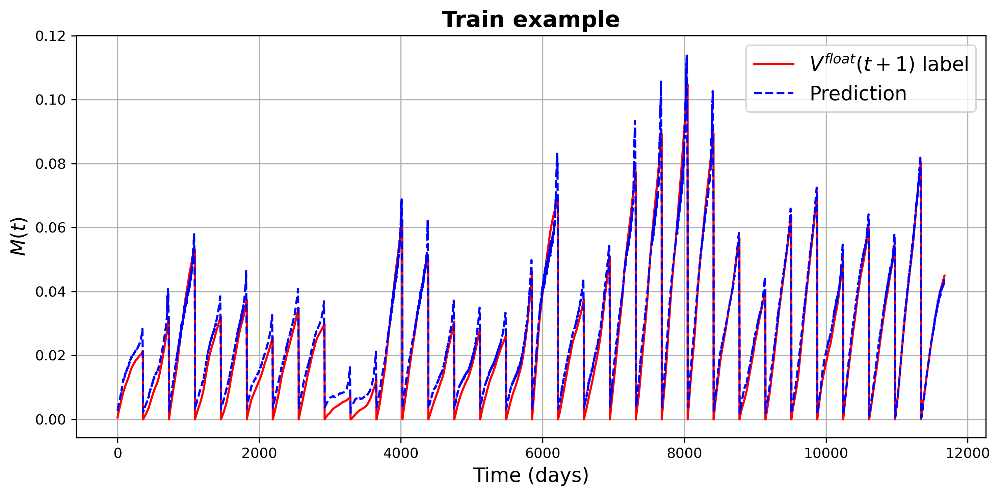

In [23]:
#Plot predictions (train)
plt.figure(figsize=(10,5), dpi=300)

plt.plot(train_float_labels, 'r-', label='$V^{float}(t+1)$ label')
plt.plot(train_float_predictions, 'b--', label='Prediction')
#plt.xlim(1000,1100)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('Train example', fontsize=16, fontweight='bold')
#plt.savefig('Train_example_loat.pdf')
plt.tight_layout()
plt.show()

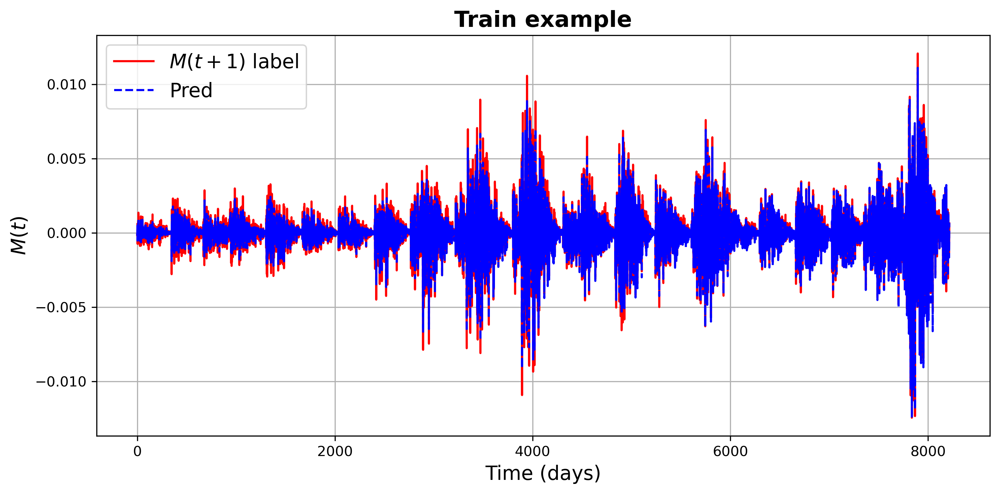

In [53]:
#Plot predictions (train)
plt.figure(figsize=(10,5), dpi=300)

plt.plot(train_margin_labels, 'r-', label='$M(t+1)$ label')
plt.plot(train_margin_predictions, 'b--', label='Pred')
#plt.xlim(1000,1100)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('Train example', fontsize=16, fontweight='bold')
plt.savefig('Train_example_margin_multiple_contracts_with_lambda.pdf')
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Non-shifted fixed train')

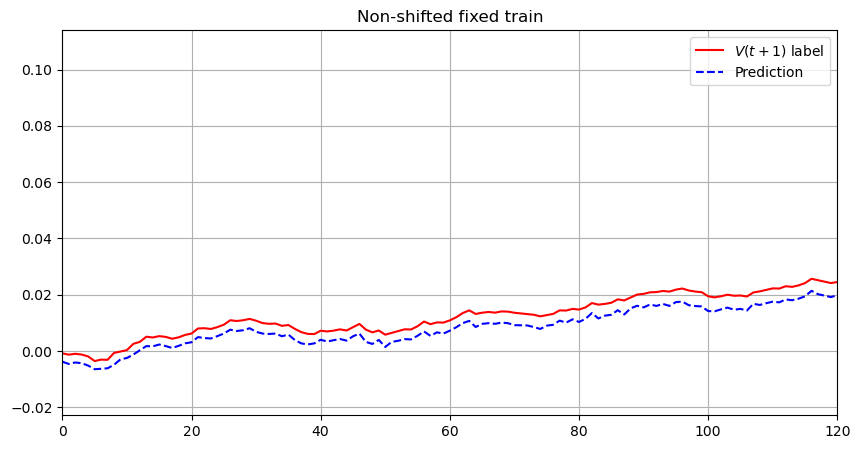

In [29]:
#Plot predictions (train)
plt.figure(figsize=(10,5))#, dpi=300)

#plt.subplot(1,2,1)
plt.plot(train_fixed_labels, 'r-', label='$V(t+1)$ label')
plt.plot(train_fixed_predictions, 'b--', label='Prediction')
plt.xlim(0,120)
plt.grid()
plt.legend()
plt.title('Non-shifted fixed train')

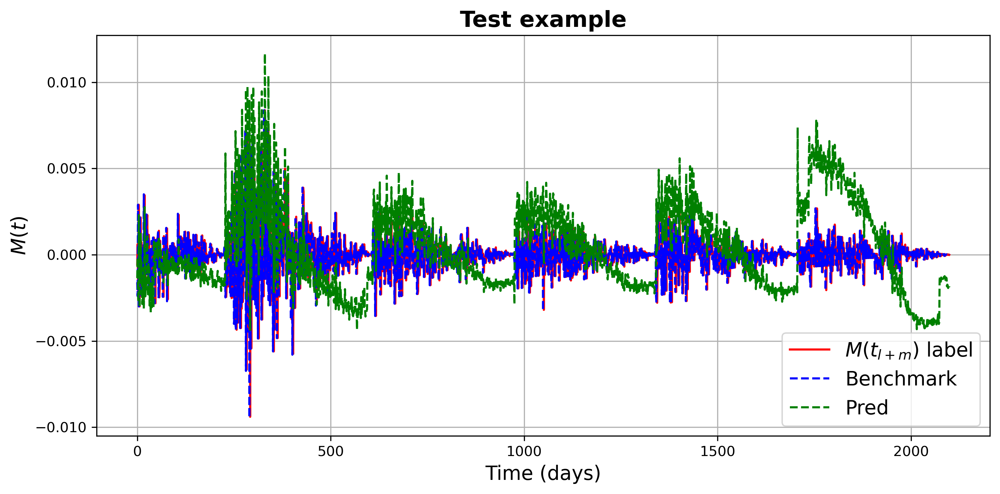

In [23]:
#Plot predictions (train)
plt.figure(figsize=(10,5), dpi=300)

#plt.subplot(1,2,1)
plt.plot(test_margin_labels, 'r-', label='$M(t_{l+m})$ label')
plt.plot(test_benchmark_labels, 'b--', label='Benchmark')
plt.plot(test_margin_predictions, 'g--', label='Pred')
#plt.xlim(825,900)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('Test example', fontsize=16, fontweight='bold')
#plt.savefig('Test_example_fixed_multiple_contracts.pdf')
plt.tight_layout()
plt.show()

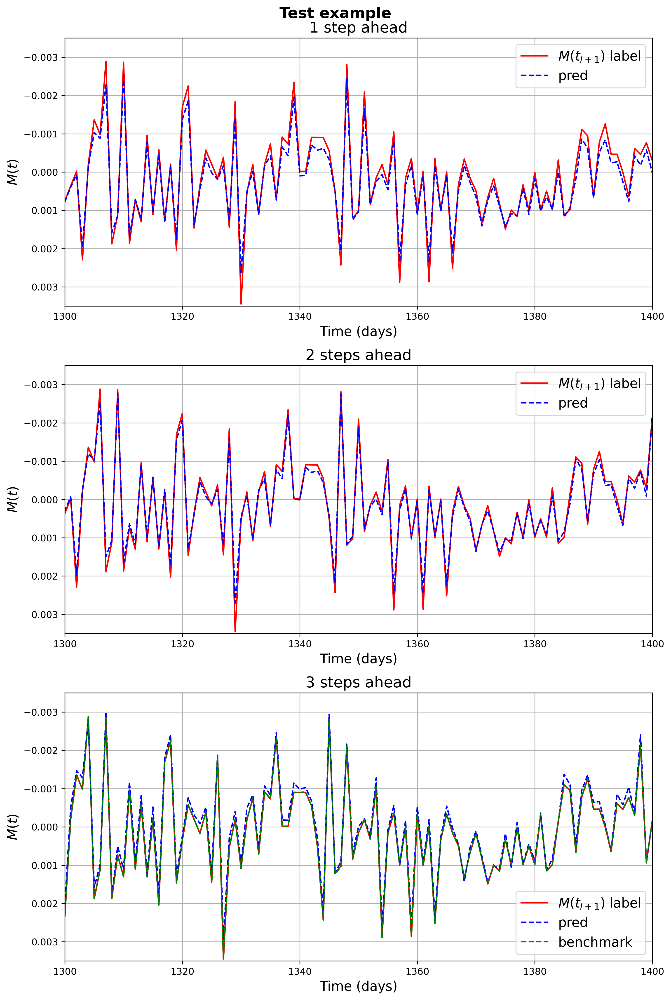

In [70]:
#Plot predictions (train)
plt.figure(figsize=(10,15), dpi=300)

plt.subplot(3,1,1)
plt.plot(test_margin_labels[:,0], 'r-', label='$M(t_{l+1})$ label')
plt.plot(test_margin_predictions[:,0], 'b--', label='pred')
plt.xlim(1300,1400)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('1 step ahead', fontsize=16)

plt.subplot(3,1,2)
plt.plot(test_margin_labels[:,1], 'r-', label='$M(t_{l+1})$ label')
plt.plot(test_margin_predictions[:,1], 'b--', label='pred')
plt.xlim(1300,1400)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('2 steps ahead', fontsize=16)

plt.subplot(3,1,3)
plt.plot(test_margin_labels[1:,2], 'r-', label='$M(t_{l+1})$ label')
plt.plot(test_margin_predictions[1:,2], 'b--', label='pred')
plt.plot(test_benchmark, 'g--', label='benchmark')
plt.xlim(1300,1400)
plt.ylim(0.0035,-0.0035)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('3 steps ahead', fontsize=16)
plt.suptitle('Test example', fontsize=16, fontweight='bold')



#plt.savefig('Train_example_fixed_multiple_contracts.pdf')
plt.tight_layout()
plt.show()

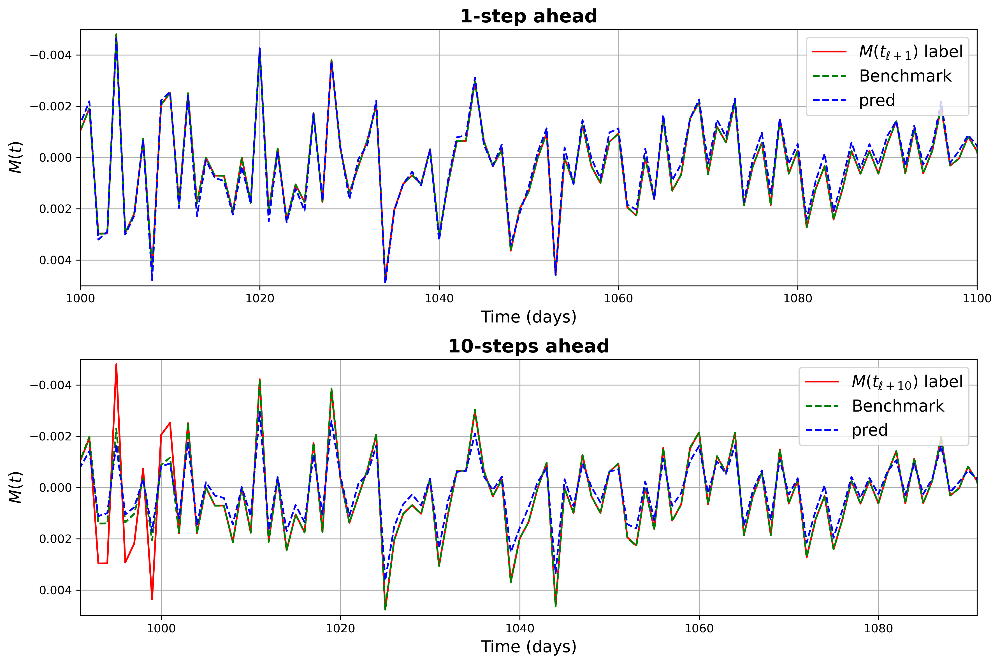

In [120]:
import matplotlib.pyplot as plt

# Plot predictions (train)
plt.figure(figsize=(12, 8), dpi=300)

plt.subplot(2,1,1)
# Second subplot (smaller, on the right)
plt.plot(test_margin_labels[1:, 0], 'r-', label='$M(t_{\ell+1})$ label')
plt.plot(test_benchmark[:, 0], 'g--', label='Benchmark')
plt.plot(test_margin_predictions[1:, 0], 'b--', label='pred')
plt.xlim(1000,1100)
plt.ylim(0.005,-0.005)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('1-step ahead', fontsize=16, fontweight='bold')


# Fourth subplot (smaller, on the right)
plt.subplot(2,1,2)
plt.plot(test_margin_labels[1:, 9], 'r-', label='$M(t_{\ell+10})$ label')
plt.plot(test_benchmark[:, 9], 'g--', label='Benchmark')
plt.plot(test_margin_predictions[1:, 9], 'b--', label='pred')
plt.xlim(991,1091)
plt.ylim(0.005,-0.005)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('10-steps ahead', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.savefig('1_step_10_steps.pdf')
plt.show()


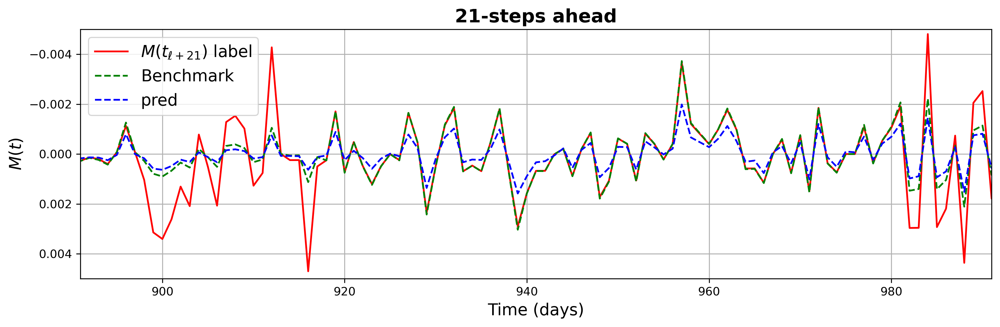

In [129]:
plt.figure(figsize=(12, 4), dpi=300)

# Fourth subplot (smaller, on the right)
plt.plot(test_margin_labels[1:, 20], 'r-', label='$M(t_{\ell+21})$ label')
plt.plot(test_benchmark[:, 20], 'g--', label='Benchmark')
plt.plot(test_margin_predictions[1:, 20], 'b--', label='pred')
plt.xlim(891,991)
plt.ylim(0.005,-0.005)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t)$', fontsize=14)
plt.title('21-steps ahead', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.savefig('21_steps_ahead.pdf')
plt.show()

In [95]:
pred_mse_test = []
bench_mse_test = []

for step in range(pred_test.shape[1]):
    
    #print(pred_test.shape)
    #print(benchmark_test.shape)
    
    #plt.plot(pred_test[1:,-1], label='pred')
    #plt.plot(benchmark_test[:-1,-1], label ='bench')
    #plt.plot(label_test[1:,-1], label ='label')
    #plt.xlim(1000,1025)
    #plt.legend()
    #break
    
    pred_mse_test.append(criterion(pred_test[1:,step], label_test[1:,step]))
    bench_mse_test.append(criterion(pred_test[1:,step], benchmark_test[:-1, step]))


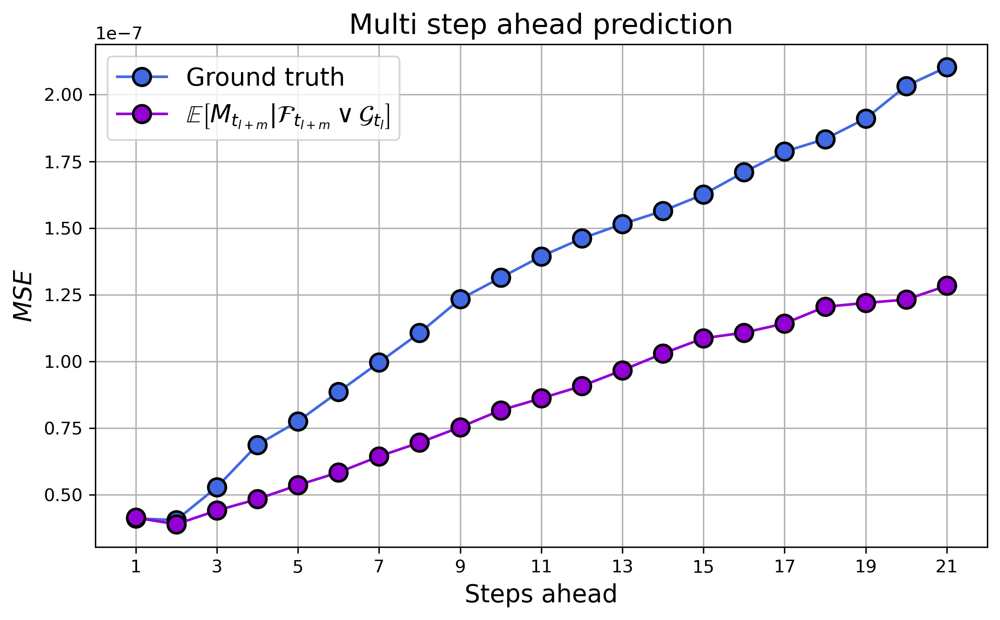

In [166]:
plt.figure(figsize=(8,5), dpi=300)
steps = np.arange(1,22)
plt.plot(steps,pred_mse_test, 'o-', c='royalblue', mec='k', mew=1.5,ms=10,  label='Ground truth')
plt.plot(steps,bench_mse_test,'o-', c='darkviolet', mec='k', mew=1.5,ms=10, label='$\mathbb{E}\left[M_{t_{l+m}} | \mathcal{F}_{t_{l+m}} \\vee \mathcal{G}_{t_{l}}  \\right]$')
plt.grid()
plt.xticks(np.arange(1,22,2))
plt.legend(fontsize=14)
plt.xlabel('Steps ahead', fontsize=14)
plt.ylabel('$MSE$', fontsize=14)
plt.title('Multi step ahead prediction', fontsize=16)
plt.tight_layout()
plt.savefig('Multi_steps_performance.pdf')
plt.show()

NameError: name 'pred_test' is not defined

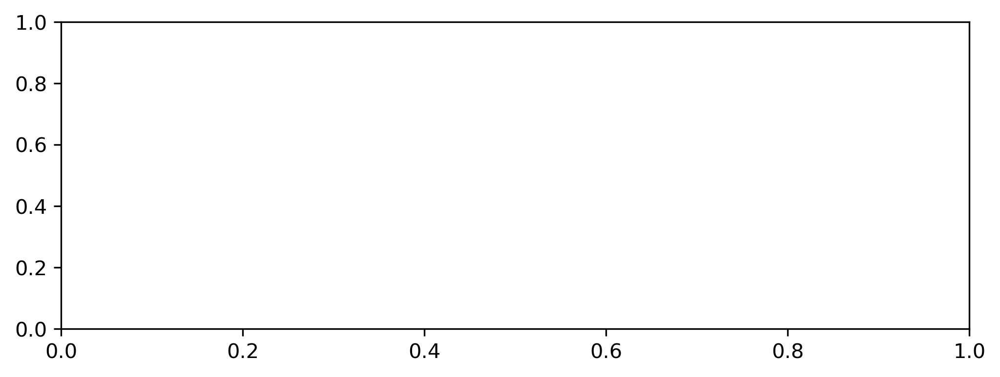

In [96]:

plt.figure(figsize=(8,6), dpi=300)
plt.subplot(2,1,1)
plt.plot(pred_test[1 + 900: 1040,1],'b--', label='pred')
plt.plot(label_test[1 + 900: 1040:,1],'r-', label ='label')
plt.plot(benchmark_test[900:1040-1, 1],'--', c='tab:green', label ='$\mathbb{E}\left[M_{t_{l+m}}\\right]$')
plt.title('2 Steps ahead example', fontsize=16)
plt.ylabel('$MSE$', fontsize=14)
plt.legend(fontsize=14, loc=(1.002,0.561))
plt.grid(True)

plt.subplot(2,1,2)
plt.plot(pred_test[1 + 881: 1021:,-1],'b--', label='pred')
plt.plot(label_test[1 + 881: 1021:,-1],'r-', label ='label')
plt.plot(benchmark_test[881:1021-1,-1],'--', c='tab:green', label ='$\mathbb{E}\left[M_{t_{l+m}}\\right]$')
plt.grid()
plt.ylabel('$M(t)$', fontsize=14)
plt.title('21 Steps ahead example', fontsize=16)
plt.legend(fontsize=14, loc=(1.002,0.561))
plt.xlabel('Time (days)', fontsize=14)

plt.tight_layout()
plt.savefig('2_steps_vs_21_steps_comparison.pdf')
plt.show()

In [25]:
steps = [1,3,6,9,12,15,18,21]
criterion = nn.MSELoss()

In [26]:
pred_mse_test = []
bench_mse_test = []
for step in steps:
    pred_test = torch.tensor(np.load(f'./results/test_pred_{step}.npy'))
    label_test = torch.tensor(np.load(f'./results/test_label_{step}.npy'))
    benchmark_test = torch.tensor(np.load(f'./results/test_benchmark_{step}.npy'))
    
    #print(pred_test.shape)
    #print(benchmark_test.shape)
    
    #plt.plot(pred_test[1:,-1], label='pred')
    #plt.plot(benchmark_test[:-1,-1], label ='bench')
    #plt.plot(label_test[1:,-1], label ='label')
    #plt.xlim(1000,1025)
    #plt.legend()
    #break
    
    pred_mse_test.append(criterion(pred_test[1:,-1], label_test[1:,-1]))
    bench_mse_test.append(criterion(pred_test[1:,-1], benchmark_test[:-1, -1]))


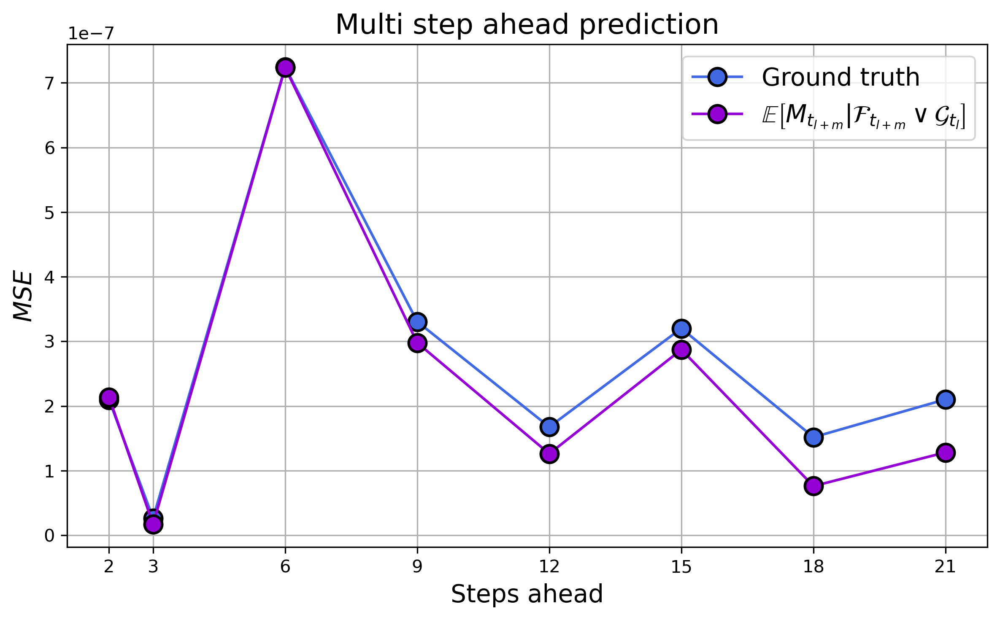

In [74]:
plt.figure(figsize=(8,5), dpi=300)
steps = [2,3,6,9,12,15,18,21]
plt.plot(steps,pred_mse_test, 'o-', c='royalblue', mec='k', mew=1.5,ms=10,  label='Ground truth')
plt.plot(steps,bench_mse_test,'o-', c='darkviolet', mec='k', mew=1.5,ms=10, label='$\mathbb{E}\left[M_{t_{l+m}} | \mathcal{F}_{t_{l+m}} \\vee \mathcal{G}_{t_{l}}  \\right]$')
plt.xticks(steps)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Steps ahead', fontsize=14)
plt.ylabel('$MSE$', fontsize=14)
plt.title('Multi step ahead prediction', fontsize=16)
plt.tight_layout()
plt.show()

In [76]:
steps = [1,3,6,9,12,15,18,21]
pred_mse_train = []
bench_mse_train = []
for step in steps:
    pred_train = torch.tensor(np.load(f'./results/train_pred_{step}.npy'))
    label_train = torch.tensor(np.load(f'./results/train_label_{step}.npy'))
    benchmark_train = torch.tensor(np.load(f'./results/train_benchmark_{step}.npy'))
    
    #print(pred_test.shape)
    #print(benchmark_test.shape)
    
    #plt.plot(pred_test[1:,-1], label='pred')
    #plt.plot(benchmark_test[:-1,-1], label ='bench')
    #plt.plot(label_test[1:,-1], label ='label')
    #plt.xlim(1000,1025)
    #plt.legend()
    #break
    
    pred_mse_train.append(criterion(pred_train[1:,-1], label_train[1:,-1]))
    bench_mse_train.append(criterion(pred_train[1:,-1], benchmark_train[:-1, -1]))


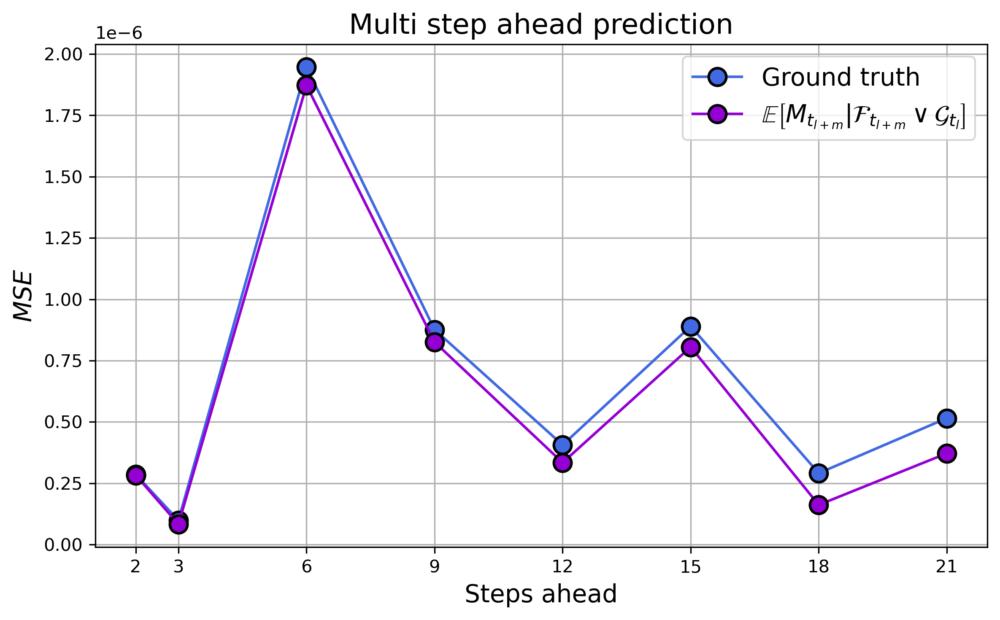

In [77]:
plt.figure(figsize=(8,5), dpi=300)
steps = [2,3,6,9,12,15,18,21]
plt.plot(steps,pred_mse_train, 'o-', c='royalblue', mec='k', mew=1.5,ms=10,  label='Ground truth')
plt.plot(steps,bench_mse_train,'o-', c='darkviolet', mec='k', mew=1.5,ms=10, label='$\mathbb{E}\left[M_{t_{l+m}} | \mathcal{F}_{t_{l+m}} \\vee \mathcal{G}_{t_{l}}  \\right]$')
plt.xticks(steps)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Steps ahead', fontsize=14)
plt.ylabel('$MSE$', fontsize=14)
plt.title('Multi step ahead prediction', fontsize=16)
plt.tight_layout()
plt.show()

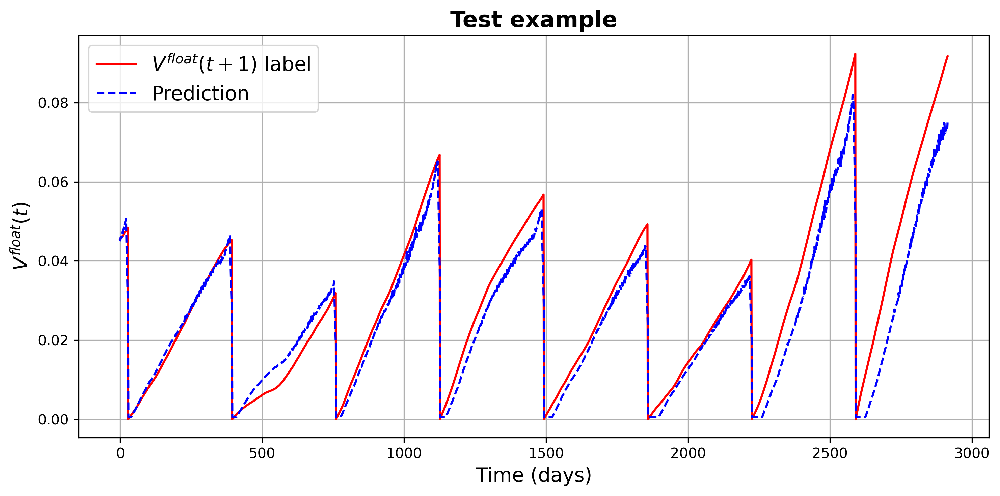

In [24]:
#Plot predictions (train)
plt.figure(figsize=(10,5), dpi=300)

plt.plot(test_float_labels, 'r-', label='$V^{float}(t+1)$ label')
plt.plot(test_float_predictions, 'b--', label='Prediction')
#plt.xlim(825,900)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$V^{float}(t)$', fontsize=14)
plt.title('Test example', fontsize=16, fontweight='bold')
#plt.savefig('Test_example_float.pdf')
plt.tight_layout()
plt.show()

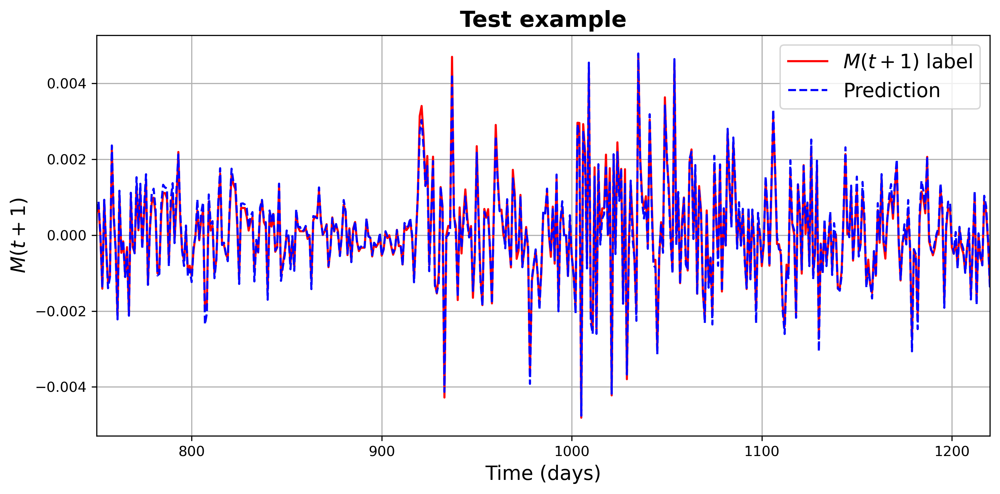

In [56]:
#Plot predictions (train)
plt.figure(figsize=(10,5), dpi=300)

plt.plot(test_margin_labels, 'r-', label='$M(t+1)$ label')
plt.plot(test_margin_predictions, 'b--', label='Prediction')
plt.xlim(750,1220)
plt.grid()
plt.legend(fontsize=14)
plt.xlabel('Time (days)', fontsize=14)
plt.ylabel('$M(t+1)$', fontsize=14)
plt.title('Test example', fontsize=16, fontweight='bold')
#plt.savefig('Test_example_margin_multiple_contracts_with_lambda.pdf')
plt.tight_layout()
plt.show()